SETUP

In [1]:
import numpy as np
import tensorflow as tf

from tensorflow import keras
import qkeras
from qkeras import *

In [2]:
X = np.load("/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/bnb_WithWire_00_batch_00_40X192.npy")

In [3]:
X.shape

(491520, 18, 16, 1)

In [4]:
from qkeras.utils import _add_supported_quantized_objects
co = {}
_add_supported_quantized_objects(co)

In [5]:
#model = keras.models.load_model("noQDB_seq", custom_objects=co)
teacher = keras.models.load_model('/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/Seokju_Models/teacher_tiles40X192_sample')
student_test = qkeras.utils.load_qmodel('/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/Seokju_Models/Cicada_QDense_seq_tiles40X192_sample')

In [6]:
teacher.summary()

Model: "teacher"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 teacher_inputs_ (InputLaye  [(None, 18, 16, 1)]       0         
 r)                                                              
                                                                 
 teacher_reshape (Reshape)   (None, 18, 16, 1)         0         
                                                                 
 teacher_conv2d_1 (Conv2D)   (None, 18, 16, 20)        200       
                                                                 
 teacher_relu_1 (Activation  (None, 18, 16, 20)        0         
 )                                                               
                                                                 
 teacher_pool_1 (AveragePoo  (None, 9, 8, 20)          0         
 ling2D)                                                         
                                                           

In [7]:
student_test.summary()

Model: "cicada-v2-qdense_seq"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 18, 16, 1)         0         
                                                                 
 conv (QConv2D)              (None, 9, 8, 4)           16        
                                                                 
 relu0 (QActivation)         (None, 9, 8, 4)           0         
                                                                 
 flatten (Flatten)           (None, 288)               0         
                                                                 
 dropout (Dropout)           (None, 288)               0         
                                                                 
 dense1 (QDenseBatchnorm)    (None, 16)                4689      
                                                                 
 relu1 (QActivation)         (None, 16)       

In [8]:
import hls4ml
import QDenseBatchnorm


In [9]:
config = hls4ml.utils.config_from_keras_model(student_test, backend='Vitis', 
                                              default_precision='fixed<32,16>',
                                              granularity='name')

Interpreting Sequential
Topology:
Layer name: reshape_input, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDenseBatchnorm, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]


/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


In [10]:
for layer in config['LayerName'].keys():
    config['LayerName'][layer]['Trace'] = True

In [11]:
config

{'Model': {'Precision': 'fixed<32,16>',
  'ReuseFactor': 1,
  'Strategy': 'Latency',
  'BramFactor': 1000000000,
  'TraceOutput': False},
 'LayerName': {'reshape_input': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>'}},
  'reshape': {'Trace': True, 'Precision': {'result': 'fixed<32,16>'}},
  'conv': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>',
    'weight': 'fixed<12,4>',
    'bias': 'fixed<32,16>',
    'accum': 'fixed<32,16>'},
   'ReuseFactor': 1,
   'ParallelizationFactor': 1,
   'ConvImplementation': 'LineBuffer'},
  'conv_linear': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>', 'table': 'fixed<18,8>'},
   'ReuseFactor': 1,
   'TableSize': 1024},
  'relu0': {'Trace': True,
   'Precision': {'result': 'ufixed<10,6,RND_CONV,SAT>',
    'table': 'fixed<18,8>'},
   'ReuseFactor': 1,
   'TableSize': 1024},
  'flatten': {'Trace': True, 'Precision': {'result': 'fixed<32,16>'}},
  'dense1': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>',
    'we

In [12]:
hls_model = hls4ml.converters.convert_from_keras_model(student_test,
                                                       hls_config=config,
                                                       io_type='io_parallel',
                                                       output_dir=f'cicada_qd_40x192_hls4mlproj')

Interpreting Sequential
Topology:
Layer name: reshape_input, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDenseBatchnorm, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]
Creating HLS model


In [13]:
X_flat = X.reshape((491520,-1))

In [14]:
X_flat.shape

(491520, 288)

In [15]:
def loss(y_true, y_pred, choice):
    if choice == 'mse':
        loss = np.mean((y_true - y_pred)**2, axis = (1,2,3))
        return loss

ntimeticks = 6400
nwire = 3456
f_downsample = 10
h_split = 10
v_split = 4
nbatch = 32

strategy = tf.distribute.MirroredStrategy()
print("Number of devices: {}".format(strategy.num_replicas_in_sync))

adccutoff = 10.*f_downsample/10.
adcsaturation = 100.*f_downsample/10.

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


Number of devices: 1


COMPILING AND PREDICTING

In [16]:
#Y = student_test.predict(X_flat)

X_predict_teacher = teacher.predict(X)
X_loss_teacher = loss(X, X_predict_teacher, 'mse')
#X_student = X.reshape((-1,nwire*ntimeticks//f_downsample//v_split//h_split,1))
Y = student_test.predict(X_flat).reshape(len(X_loss_teacher))


15360/15360 [==============================] - 8s 493us/step


In [17]:
hls_model.compile()

Writing HLS project


/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


Done


In [18]:
fake_hls4ml_pred, hls4ml_trace = hls_model.trace(X)

Recompiling myproject with tracing
Writing HLS project
Done


In [19]:
#Y_hls = hls_model.predict(X_flat)
y_predict_hls4ml_q = hls_model.predict(X_flat).reshape(len(X_loss_teacher))


RESULTS

In [20]:
for j in Y:
    print(j)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
17.796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.3046875
0.0
0.0
0.0
0.0
0.0
0.0
10.859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

In [21]:
for i in y_predict_hls4ml_q:
    print(i)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
17.796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.3046875
0.0
0.0
0.0
0.0
0.0
0.0
10.859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

In [26]:
import matplotlib.pyplot as plt

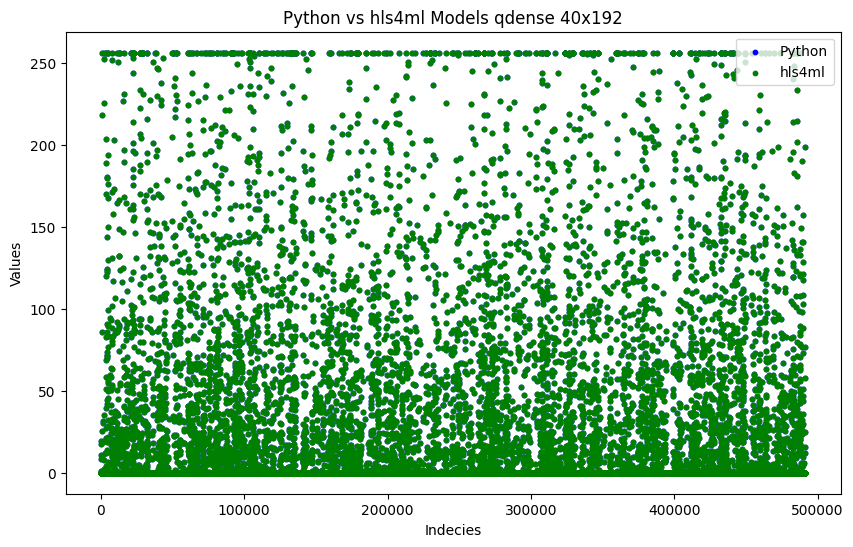

In [39]:
differences = [pred1 != pred2 for pred1, pred2 in zip(Y, y_predict_hls4ml_q)]

plt.figure(figsize=(10, 6))
plt.scatter(range(len(Y)), Y, color='blue', s=10, label='Python')
plt.scatter(range(len(y_predict_hls4ml_q)), y_predict_hls4ml_q, color='green', s=10, label='hls4ml')

plt.xlabel('Indecies')
plt.ylabel('Values')
plt.title('Python vs hls4ml Models qdense 40x192')
plt.legend()
plt.show()
# Labels and title

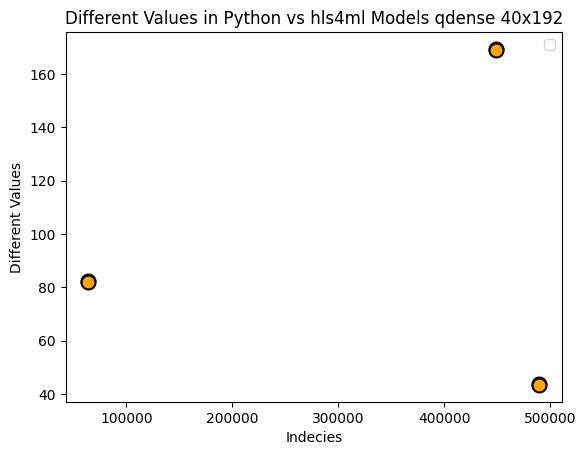

In [40]:
for i, diff in enumerate(differences):
    if diff:
        plt.scatter(i, Y[i], color='red', edgecolor='black', s=100, linewidth=1.5)
        plt.scatter(i, y_predict_hls4ml_q[i], color='orange', edgecolor='black', s=100, linewidth=1.5)

plt.xlabel('Indecies')
plt.ylabel('Different Values')
plt.title('Different Values in Python vs hls4ml Models qdense 40x192')
plt.legend()
plt.show()

In [22]:
off_list = np.argwhere(~np.isclose(Y, y_predict_hls4ml_q))

In [23]:
non_zero_list = np.argwhere(~np.isclose(0.0, y_predict_hls4ml_q))

In [24]:
len(off_list)

3

In [25]:
len(non_zero_list)

7198

In [28]:
off_list_indexes = []
for k in off_list:
    off_list_indexes.append(k[0])

for ind in off_list_indexes:
    print("Y: ")
    print(Y[ind])
    print("hls pred: ")
    print(y_predict_hls4ml_q[ind])

Y: 
82.36719
hls pred: 
82.10546875
Y: 
169.39062
hls pred: 
169.01953125
Y: 
43.808594
hls pred: 
43.421875


In [29]:
diff_sum=0
for ind in off_list_indexes:
    diff = abs(Y[ind] - y_predict_hls4ml_q[ind])
    diff_sum=diff_sum+diff
diff_avg = diff_sum/len(off_list)
print(diff_avg)

0.33984375


In [30]:
diff_pct = []
for ind in off_list_indexes:
    diff = abs(Y[ind] - y_predict_hls4ml_q[ind])
    temp_diff_pct = diff/Y[ind]
    diff_pct.append(temp_diff_pct)
print(diff_pct)

[0.003177463720003794, 0.002190757310211235, 0.008827463218903254]


In [32]:
diff_pct_avg = sum(diff_pct)/len(diff_pct)
print(diff_pct_avg)

0.0047318947497060945


In [30]:
np.allclose(Y, y_predict_hls4ml_q, atol=0.4)

True

WEIGHTS

Interpreting Sequential
Topology:
Layer name: reshape_input, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDenseBatchnorm, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]
Creating HLS model
Profiling weights (before optimization)


(<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 None,
 None)

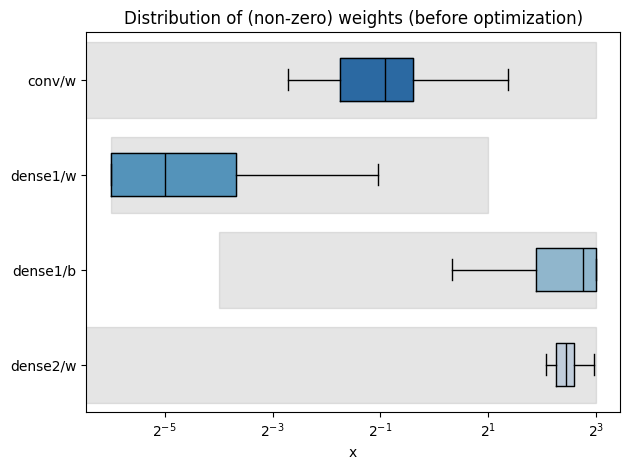

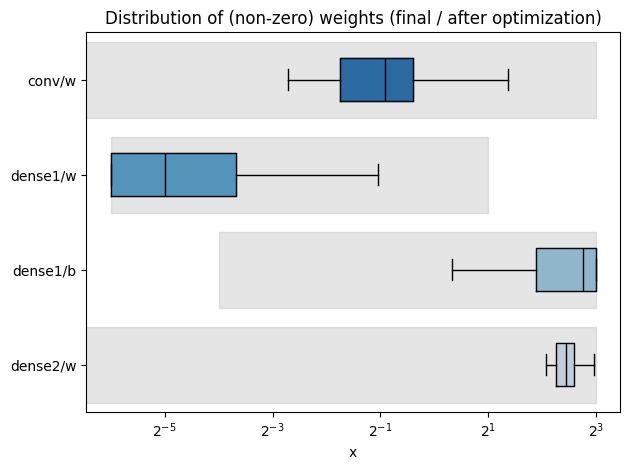

In [31]:
hls4ml.model.profiling.numerical(model=student_test, hls_model=hls_model)

In [32]:
print(hls4ml_trace)

{'conv': array([[[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        ...,

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
      

In [35]:
layers = student_test.layers
conv_weights = student_test.layers[1].get_weights()
dense_weights = student_test.layers[5].get_weights()
qdensebatchnorm_weights = student_test.layers[8].get_weights()
print(layers)
print(conv_weights)
print(dense_weights)
print(qdensebatchnorm_weights)

[<keras.src.layers.reshaping.reshape.Reshape object at 0x300f24940>, <qkeras.qconvolutional.QConv2D object at 0x300f24eb0>, <qkeras.qlayers.QActivation object at 0x300f51390>, <keras.src.layers.reshaping.flatten.Flatten object at 0x300f512d0>, <keras.src.layers.regularization.dropout.Dropout object at 0x300f52f50>, <qkeras.qdense_batchnorm.QDenseBatchnorm object at 0x300f52fb0>, <qkeras.qlayers.QActivation object at 0x300f68a30>, <keras.src.layers.regularization.dropout.Dropout object at 0x300fc7f70>, <qkeras.qlayers.QDense object at 0x300fc41c0>, <qkeras.qlayers.QActivation object at 0x300fc6a10>]
[array([[[[ 0.46082294,  1.6052188 , -0.7416309 , -0.18574904]],

        [[-0.2914767 , -2.5825098 , -0.8078488 ,  0.40474176]]],


       [[[-0.724072  , -0.15111317, -0.26356298,  0.599366  ]],

        [[ 1.046855  , -0.2999867 , -0.7251304 , -0.41723025]]]],
      dtype=float32)]
[array([[ 1.9973556 , -1.6225761 ,  0.10324712, ...,  1.6921778 ,
         1.9682398 , -0.7970248 ],
       

In [36]:
#print(min(conv_weights))
conv_weights_list = []
for i in conv_weights[0][0][0][0]:
    conv_weights_list.append(i)
for j in conv_weights[0][1][0][0]:
    conv_weights_list.append(j)
print(min(conv_weights_list), max(conv_weights_list))

-0.7416309 1.6052188


In [37]:
print(min(dense_weights[0]), max(dense_weights[0]))

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [30]:
import os

os.environ['PATH'] = os.environ['XILINX_VIVADO'] + '/bin:' + os.environ['PATH']

KeyError: 'XILINX_VIVADO'

In [30]:
hls4ml build -p complex_hls4mlproj

SyntaxError: invalid syntax (3971047448.py, line 1)

In [29]:
hls_model.build(csim=False, synth=True, vsynth=True)

Project myproject_prj does not exist. Rerun "hls4ml build -p complex_hls4mlproj".


sh: vivado_hls: command not found


In [ ]:
from pathlib import Path
import pprint

def getReports(indir):
    data_ = {}

    report_vsynth = Path('{}/vivado_synth.rpt'.format(indir))
    report_csynth = Path('{}/myproject_prj/solution1/syn/report/myproject_csynth.rpt'.format(indir))

    if report_vsynth.is_file() and report_csynth.is_file():
        print('Found valid vsynth and synth in {}! Fetching numbers'.format(indir))

        # Get the resources from the logic synthesis report
        with report_vsynth.open() as report:
            lines = np.array(report.readlines())
            data_['lut'] = int(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[2])
            data_['ff'] = int(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[2])
            data_['bram'] = float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[2])
            data_['dsp'] = int(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[2])
            data_['lut_rel'] = float(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[5])
            data_['ff_rel'] = float(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[5])
            data_['bram_rel'] = float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[5])
            data_['dsp_rel'] = float(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[5])

        with report_csynth.open() as report:
            lines = np.array(report.readlines())
            lat_line = lines[np.argwhere(np.array(['Latency (cycles)' in line for line in lines])).flatten()[0] + 3]
            data_['latency_clks'] = int(lat_line.split('|')[2])
            data_['latency_mus'] = float(lat_line.split('|')[2]) * 5.0 / 1000.0
            data_['latency_ii'] = int(lat_line.split('|')[6])

    return data_

In [ ]:
data_quantized_pruned = getReports('complex_hls4mlproj')

print("\n Resource usage and latency: ")
pprint.pprint(data_quantized_pruned)